# Compute changepoints for a dataset before and after transformation

In [3]:
import re
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
from toolz import groupby, valmap, compose
from toolz.curried import get, pluck
from pathlib import Path
from sklearn.decomposition import PCA
from sklearn.cluster import k_means
from scipy.spatial.distance import cdist

from aging.plotting import format_plots, PlotConfig, save_factory, figure
from aging.size_norm.data import clean
from sklearn.random_projection import GaussianRandomProjection

In [4]:
def get_name(file):
    with h5py.File(file, 'r') as h5f:
        return h5f['metadata/acquisition/SessionName'][()].decode()

In [5]:
format_plots()
c = PlotConfig()
saver = save_factory(c.save_path / 'size-normalization', tight_layout=False)

In [6]:
pattern = re.compile(r'(\d{1,2}[wm])')

folder = Path('/n/groups/datta/win/longtogeny/data/ontogeny/version_03/all_data_pca/Ontogeny_males')
files = sorted(folder.glob('*.h5'))
names = list(map(get_name, files))
ages = [pattern.search(n).group(0) for n in names]
groups = groupby(get(0), list(zip(ages, files)))
groups = valmap(compose(list, pluck(1)), groups)

In [7]:
def zscore(arr):
    return (arr - arr.mean(axis=0, keepdims=True)) / arr.std(axis=0, keepdims=True)

## Test with example file

In [7]:
file = groups['3m'][0]
with h5py.File(file, 'r') as h5f:
    frames = np.array(list(map(clean, h5f['frames'][()])))
    transformed_frames = h5f['win_size_norm_frames_v2'][()].astype('uint8')
mdl = GaussianRandomProjection(n_components=200)
proj = mdl.fit_transform(frames.reshape(len(frames), -1))
proj_t = mdl.transform(transformed_frames.reshape(len(transformed_frames), -1))

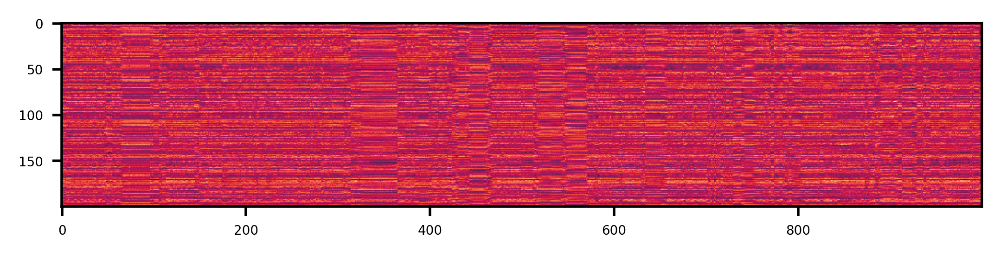

In [21]:
plt.imshow(zscore(zscore(proj).T[:, :1000]))

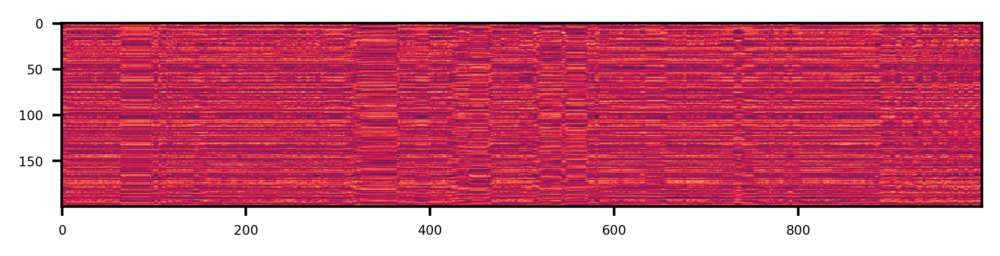

In [22]:
plt.imshow(zscore(zscore(proj_t).T[:, :1000]))

## Another example

In [24]:
n_frames = 1000
file = groups['18m'][0]
with h5py.File(file, 'r') as h5f:
    frames = np.array(list(map(clean, h5f['frames'][:n_frames])))
    transformed_frames = h5f['win_size_norm_frames_v2'][:n_frames].astype('uint8')
mdl = GaussianRandomProjection(n_components=200)
proj = mdl.fit_transform(frames.reshape(len(frames), -1))
proj_t = mdl.transform(transformed_frames.reshape(len(transformed_frames), -1))

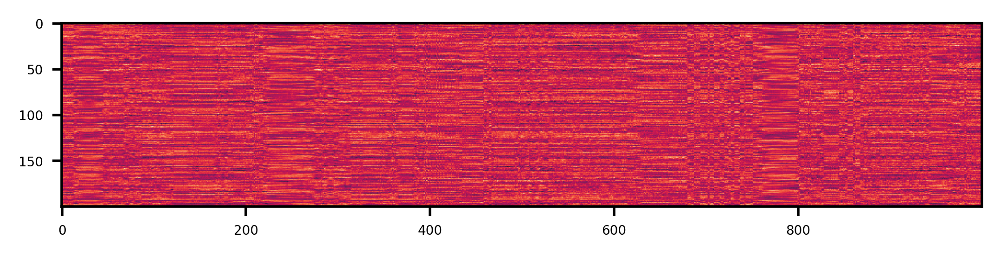

In [25]:
plt.imshow(zscore(zscore(proj).T))

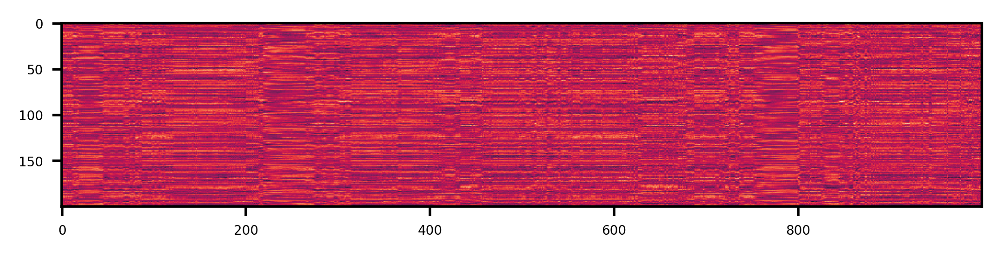

In [26]:
plt.imshow(zscore(zscore(proj_t).T))

In [8]:
n_frames = 1000
file = groups['3w'][0]
with h5py.File(file, 'r') as h5f:
    frames = np.array(list(map(clean, h5f['frames'][:n_frames])))
    transformed_frames = h5f['win_size_norm_frames_v2'][:n_frames].astype('uint8')
mdl = GaussianRandomProjection(n_components=200)
proj = mdl.fit_transform(frames.reshape(len(frames), -1))
proj_t = mdl.transform(transformed_frames.reshape(len(transformed_frames), -1))

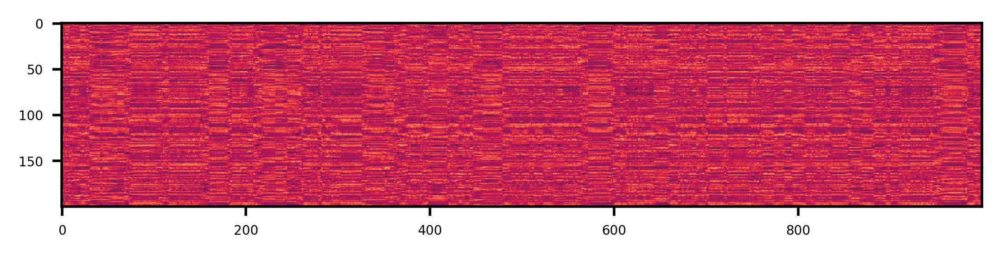

In [9]:
plt.imshow(zscore(zscore(proj).T))

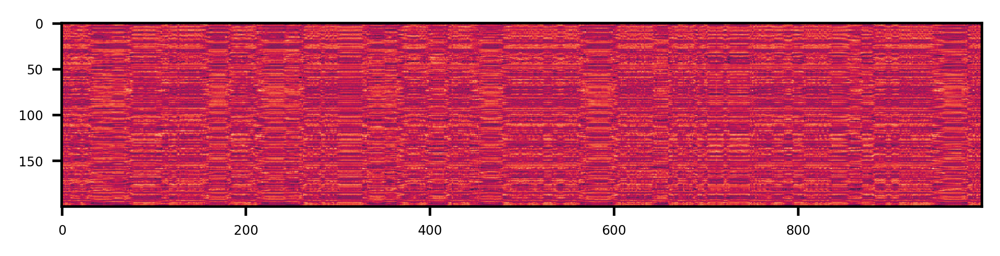

In [10]:
plt.imshow(zscore(zscore(proj_t).T))